In [1]:
import ultralytics
ultralytics.checks()
from ultralytics import YOLO
from PIL import Image

import torch
import yaml

import os
import random
from ultralytics.utils.plotting import plot_labels
import numpy as np
import pandas as pd
import sys
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.integrate import simpson
from sklearn import metrics



module_path = os.path.abspath(os.path.join('..'))
print(module_path)
module_path = module_path+'/data_preprocessing'
print(module_path)

if module_path not in sys.path:
    sys.path.append(module_path)

import visualization_utils as visutils

Ultralytics YOLOv8.0.199 🚀 Python-3.11.6 torch-2.1.0+cu121 CUDA:0 (NVIDIA RTX A5000, 24248MiB)
Setup complete ✅ (32 CPUs, 251.6 GB RAM, 0.1/125.8 GB disk)


/vast/palmer/home.grace/eec42/BirdDetector/src
/vast/palmer/home.grace/eec42/BirdDetector/src/data_preprocessing


In [2]:
device = "0" if torch.cuda.is_available() else "cpu"
if device == "0":
    torch.cuda.set_device(0) # Set to your desired GPU number

print(device)

0


In [8]:
dataset_name = 'baseline1_pfeifer_penguins_poland_palmyra_mckellar_10percent_background'
model_name = 'pfeifer_penguins_poland_palmyra_mckellar_10percentbckgd_yolov8m_120epoch'
model = YOLO('runs/detect/' + model_name + '/weights/best.pt')

IOU_THRESHOLD = 0.1
NB_CONF_THRESHOLDS = 50
CONF_THRESHOLDS = np.linspace(0, 1, NB_CONF_THRESHOLDS)

In [5]:
CONF_THRESHOLDS

array([          0,    0.020408,    0.040816,    0.061224,    0.081633,     0.10204,     0.12245,     0.14286,     0.16327,     0.18367,     0.20408,     0.22449,      0.2449,     0.26531,     0.28571,     0.30612,     0.32653,     0.34694,     0.36735,     0.38776,     0.40816,     0.42857,     0.44898,     0.46939,
            0.4898,      0.5102,     0.53061,     0.55102,     0.57143,     0.59184,     0.61224,     0.63265,     0.65306,     0.67347,     0.69388,     0.71429,     0.73469,      0.7551,     0.77551,     0.79592,     0.81633,     0.83673,     0.85714,     0.87755,     0.89796,     0.91837,     0.93878,     0.95918,
           0.97959,           1])

In [9]:
#fname = "data.yaml"
#stream = open(fname, 'r')
#data = yaml.safe_load(stream)
#img_path = data['path'] + '/test/'
img_path = '/gpfs/gibbs/project/jetz/eec42/data/' + dataset_name + '/test/'

img_list = os.listdir(img_path + '/images/')

In [10]:
def box_iou(box1, box2, eps=1e-7):
    """
    Calculate intersection-over-union (IoU) of boxes. Both sets of boxes are expected to be in (x1, y1, x2, y2) format.
    Based on https://github.com/pytorch/vision/blob/master/torchvision/ops/boxes.py

    Args:
        box1 (torch.Tensor): A tensor of shape (N, 4) representing N bounding boxes.
        box2 (torch.Tensor): A tensor of shape (M, 4) representing M bounding boxes.
        eps (float, optional): A small value to avoid division by zero. Defaults to 1e-7.

    Returns:
        (torch.Tensor): An NxM tensor containing the pairwise IoU values for every element in box1 and box2.
    """

    # inter(N,M) = (rb(N,M,2) - lt(N,M,2)).clamp(0).prod(2)
    (a1, a2), (b1, b2) = box1.unsqueeze(1).chunk(2, 2), box2.unsqueeze(0).chunk(2, 2)
    inter = (torch.min(a2, b2) - torch.max(a1, b1)).clamp_(0).prod(2)

    # IoU = inter / (area1 + area2 - inter)
    return inter / ((a2 - a1).prod(2) + (b2 - b1).prod(2) - inter + eps)


In [11]:
# match_predictions method from YOLOv8 code - try to reuse it to simplify

def match_predictions(pred_classes, true_classes, iou, use_scipy=False):
    """
    Matches predictions to ground truth objects (pred_classes, true_classes) using IoU.

    Args:
        pred_classes (torch.Tensor): Predicted class indices of shape(N,).
        true_classes (torch.Tensor): Target class indices of shape(M,).
        iou (torch.Tensor): An NxM tensor containing the pairwise IoU values for predictions and ground of truth
        use_scipy (bool): Whether to use scipy for matching (more precise).

    Returns:
        (torch.Tensor): Correct tensor of shape(N,1) for 1 IoU thresholds.
    """
    # Dx10 matrix, where D - detections, 10 - IoU thresholds
    correct = np.zeros((pred_classes.shape[0], 1)).astype(bool)
    # LxD matrix where L - labels (rows), D - detections (columns)
    correct_class = true_classes[:, None] == pred_classes
    iou = iou * correct_class  # zero out the wrong classes
    iou = iou.cpu().numpy()
    threshold = IOU_THRESHOLD
    #for i, threshold in enumerate(self.iouv.cpu().tolist()):
    if use_scipy:
        # WARNING: known issue that reduces mAP in https://github.com/ultralytics/ultralytics/pull/4708
        import scipy  # scope import to avoid importing for all commands
        cost_matrix = iou * (iou >= threshold)
        if cost_matrix.any():
            labels_idx, detections_idx = scipy.optimize.linear_sum_assignment(cost_matrix, maximize=True)
            valid = cost_matrix[labels_idx, detections_idx] > 0
            if valid.any():
                correct[detections_idx[valid]] = True
    else:
        matches = np.nonzero(iou >= threshold)  # IoU > threshold and classes match
        matches = np.array(matches).T
        if matches.shape[0]:
            if matches.shape[0] > 1:
                matches = matches[iou[matches[:, 0], matches[:, 1]].argsort()[::-1]]
                matches = matches[np.unique(matches[:, 1], return_index=True)[1]]
                # matches = matches[matches[:, 2].argsort()[::-1]]
                matches = matches[np.unique(matches[:, 0], return_index=True)[1]]
            correct[matches[:, 1].astype(int)] = True
    return torch.tensor(correct, dtype=torch.bool, device=pred_classes.device)


In [8]:
#img_list = random.choices(os.listdir(img_path + '/images/'), k=1)

# Retrieve TP, FP, FN metrics

In [12]:
# tensors to store metrics: each line is a confidence threshold, columns are images
TP = torch.zeros((NB_CONF_THRESHOLDS, len(img_list)), dtype=torch.float32)
FN = torch.zeros((NB_CONF_THRESHOLDS, len(img_list)), dtype=torch.float32)
FP = torch.zeros((NB_CONF_THRESHOLDS, len(img_list)), dtype=torch.float32)


for conf_i, conf_threshold in enumerate(CONF_THRESHOLDS):

    for img_i, img in enumerate(img_list):

        # Apply model
        result = model.predict(
            #model = 'runs/detect/pfeifer_yolov8n_70epoch_default_batch32_dropout0.3',
            source = [os.path.join(img_path + 'images/', img)],
            conf = conf_threshold, 
            iou = IOU_THRESHOLD,
            show=False,
            save=False
        )[0]

        pred_classes = result.boxes.cls.cpu()
        pred_bboxes = result.boxes.xyxyn.cpu()

        #print("NB of predictions: ", len(pred_bboxes))

        # TODO: see if there's no easier way to read true labels, maybe take a yolov8 method
        selected_label = img_path + 'labels/' + os.path.basename(result.path).split('.jpg')[0] + '.txt'
        true_bboxes = torch.tensor([], dtype=torch.float32)
        true_classes = torch.tensor([], dtype=torch.float32)
        if os.path.exists(selected_label):
            df = pd.read_csv(selected_label, sep='\t', header=None, index_col=False)
            for irow, row in df.iterrows():  
                true_classes = torch.cat((true_classes, torch.tensor([row[0]], dtype=torch.float32)), 0)
                true_bboxes = torch.cat((true_bboxes, torch.tensor([[row[1]-row[3]/2, row[2]-row[4]/2, row[1]+row[3]/2, row[2]+row[4]/2]], dtype=torch.float32)), 0)
        #print("NB of labels: ", len(true_bboxes))
        
            iou = box_iou(true_bboxes, pred_bboxes)
        else:
            iou = torch.zeros((len(true_bboxes), len(pred_bboxes)), dtype=torch.float32)
        correct = match_predictions(pred_classes, true_classes, iou)  # what they call tp in the code !!!!

        img_TP = correct.sum()
        img_FN = len(true_bboxes) - img_TP
        img_FP = len(pred_bboxes) - img_TP

        TP[conf_i, img_i] = (img_TP)
        FN[conf_i, img_i] = (img_FN)
        FP[conf_i, img_i] = (img_FP)



0: 640x640 252 birds, 6.0ms
Speed: 4.5ms preprocess, 6.0ms inference, 328.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 249 birds, 6.1ms
Speed: 2.2ms preprocess, 6.1ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 128 birds, 6.0ms
Speed: 1.0ms preprocess, 6.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 194 birds, 6.0ms
Speed: 1.8ms preprocess, 6.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 223 birds, 6.0ms
Speed: 1.0ms preprocess, 6.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 182 birds, 6.0ms
Speed: 1.9ms preprocess, 6.0ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 300 birds, 6.0ms
Speed: 1.9ms preprocess, 6.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 300 birds, 6.0ms
Speed: 1.1ms preprocess, 6.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640

In [13]:
final_TP = torch.sum(TP, dim=1)
final_FN = torch.sum(FN, dim=1)
final_FP = torch.sum(FP, dim=1)
final_TN = torch.zeros_like(final_TP)

In [14]:
eps = 1e-8
precision = final_TP / (final_TP + final_FP + eps)
recall = final_TP / (final_TP + final_FN + eps)

# Plot Confusion matrix at various confidence thresholds (0.1, 0.2, 0.5)

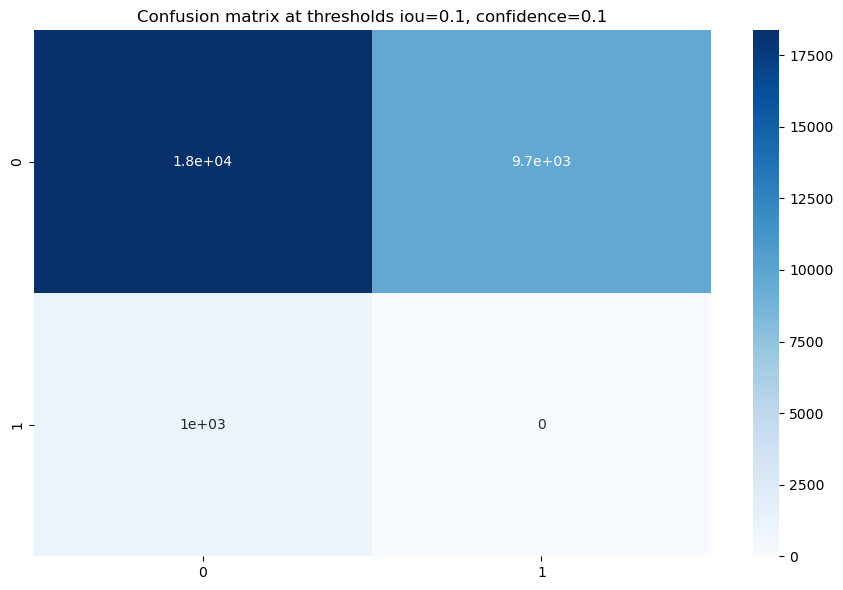

In [15]:
# Confusion matrix at confidence_threshold = 0.102
save_dir = '/vast/palmer/home.grace/eec42/BirdDetector/src/model/runs/detect/' + model_name + '/custom_confusion_matrix_conf01.jpg'

fig, ax = plt.subplots(1, 1, figsize=(9, 6), tight_layout=True)
cf_matrix = [[final_TP[5], final_FP[5]],[final_FN[5], final_TN[5]]]
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.title(f'Confusion matrix at thresholds iou={IOU_THRESHOLD}, confidence={round(CONF_THRESHOLDS[5], 2)}')
plt.show()
fig.savefig(save_dir, dpi=250)

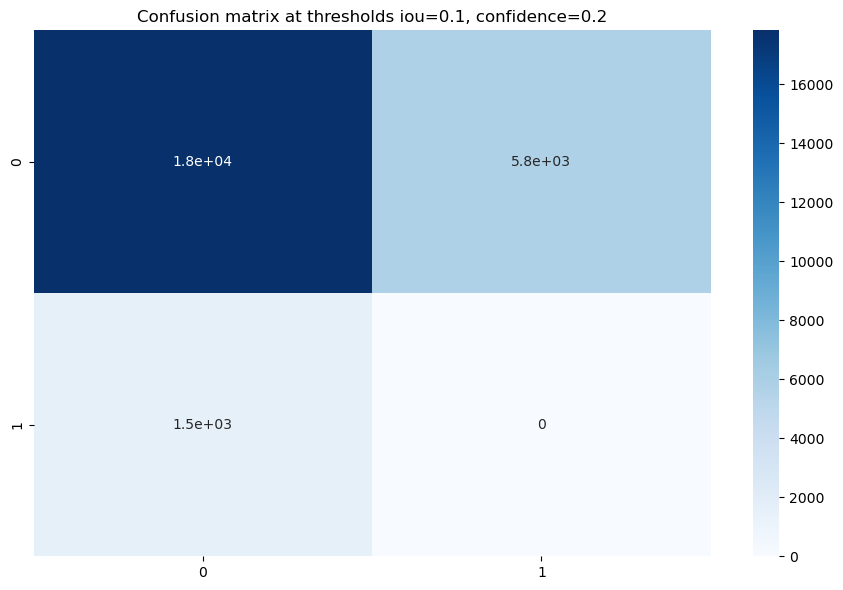

In [16]:
# Confusion matrix at confidence_threshold = 0.204
save_dir = '/vast/palmer/home.grace/eec42/BirdDetector/src/model/runs/detect/' + model_name + '/custom_confusion_matrix_conf02.jpg'

fig, ax = plt.subplots(1, 1, figsize=(9, 6), tight_layout=True)
cf_matrix = [[final_TP[10], final_FP[10]],[final_FN[10], final_TN[10]]]
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.title(f'Confusion matrix at thresholds iou={IOU_THRESHOLD}, confidence={round(CONF_THRESHOLDS[10], 2)}')
plt.show()
fig.savefig(save_dir, dpi=250)

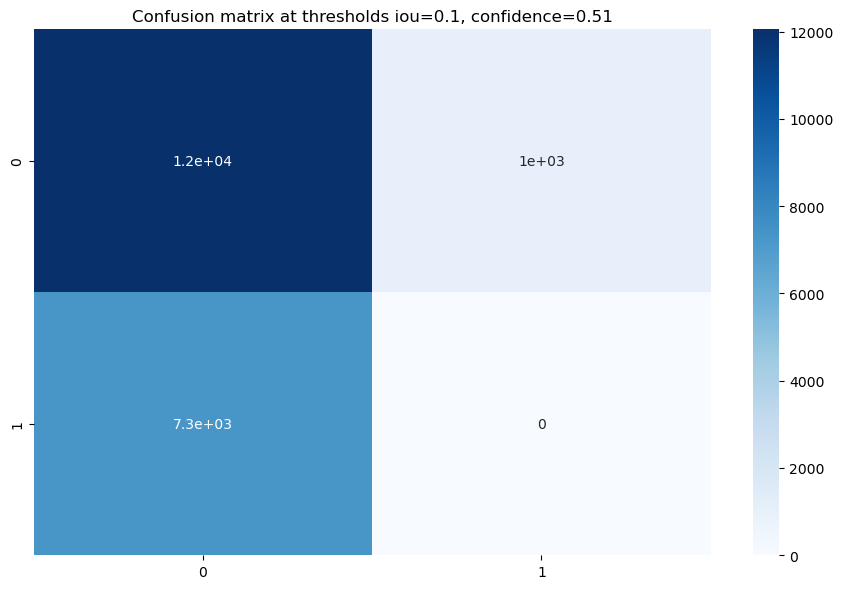

In [17]:
# Confusion matrix at confidence_threshold = 0.51
save_dir = '/vast/palmer/home.grace/eec42/BirdDetector/src/model/runs/detect/' + model_name + '/custom_confusion_matrix_conf05.jpg'

fig, ax = plt.subplots(1, 1, figsize=(9, 6), tight_layout=True)
cf_matrix = [[final_TP[25], final_FP[25]],[final_FN[25], final_TN[25]]]
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.title(f'Confusion matrix at thresholds iou={IOU_THRESHOLD}, confidence={round(CONF_THRESHOLDS[25], 2)}')
plt.show()
fig.savefig(save_dir, dpi=250)

# Plot Precision, Recall, PR and F1 curves

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


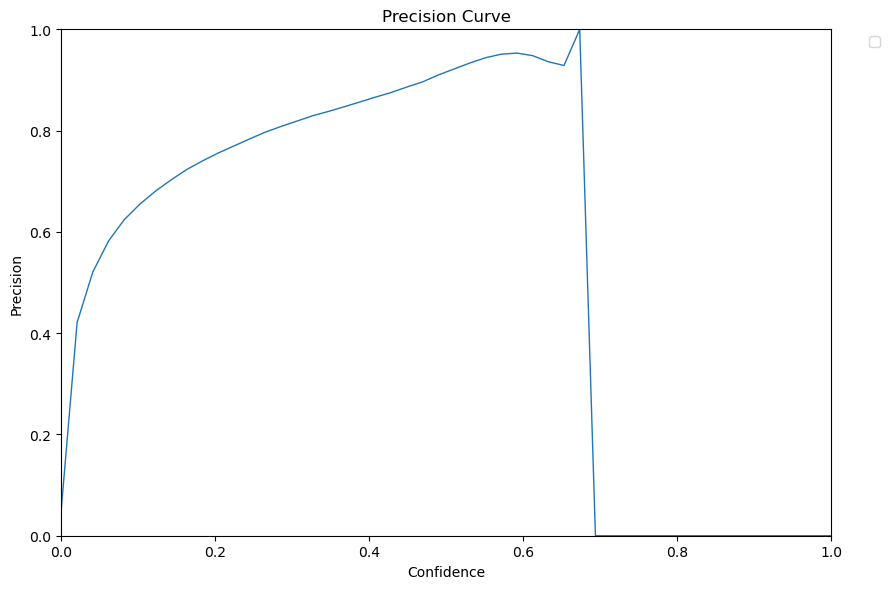

In [18]:
py = precision
px = CONF_THRESHOLDS
save_dir = '/vast/palmer/home.grace/eec42/BirdDetector/src/model/runs/detect/' + model_name + '/custom_P_curve.jpg'

fig, ax = plt.subplots(1, 1, figsize=(9, 6), tight_layout=True)
#py = np.stack(py, axis=1)

#for i, y in enumerate(py.T):
ax.plot(px, py, linewidth=1) #, label=f'{names[i]} {ap[i, 0]:.3f}')  # plot(recall, precision)

#ax.plot(px, py.mean(1), linewidth=3, color='blue', label='all classes %.3f mAP@0.5' % ap[:, 0].mean())
ax.set_xlabel('Confidence')
ax.set_ylabel('Precision')
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.legend(bbox_to_anchor=(1.04, 1), loc='upper left')
ax.set_title('Precision Curve')
fig.savefig(save_dir, dpi=250)
plt.show()
plt.close(fig)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


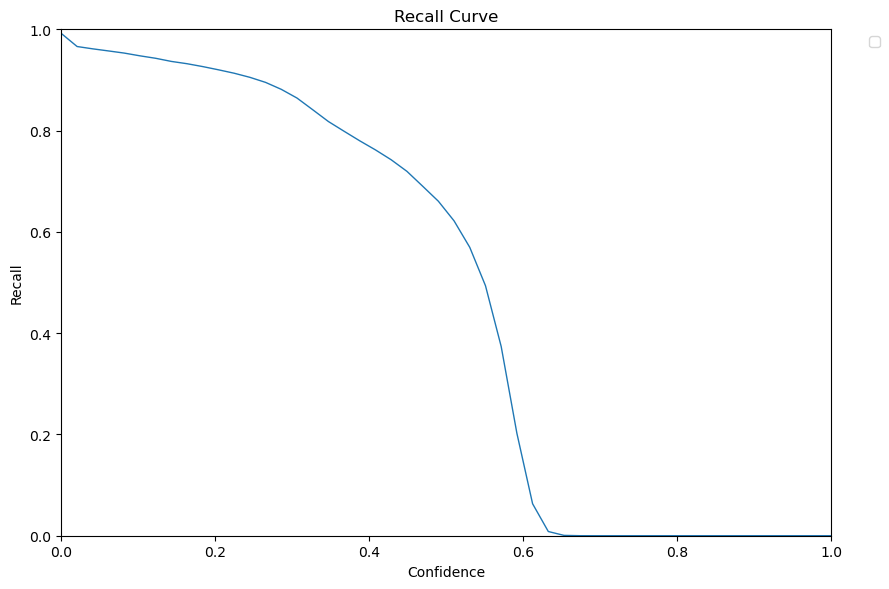

In [19]:
py = recall
px = CONF_THRESHOLDS
save_dir = '/vast/palmer/home.grace/eec42/BirdDetector/src/model/runs/detect/' + model_name + '/custom_R_curve.jpg'

fig, ax = plt.subplots(1, 1, figsize=(9, 6), tight_layout=True)
#py = np.stack(py, axis=1)

#for i, y in enumerate(py.T):
ax.plot(px, py, linewidth=1) #, label=f'{names[i]} {ap[i, 0]:.3f}')  # plot(recall, precision)

#ax.plot(px, py.mean(1), linewidth=3, color='blue', label='all classes %.3f mAP@0.5' % ap[:, 0].mean())
ax.set_xlabel('Confidence')
ax.set_ylabel('Recall')
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.legend(bbox_to_anchor=(1.04, 1), loc='upper left')
ax.set_title('Recall Curve')
fig.savefig(save_dir, dpi=250)
plt.show()
plt.close(fig)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


area = 0.8804633617401123
Average Precision = area under PR curve, according to simpson interpolation =  0.8804633617401123


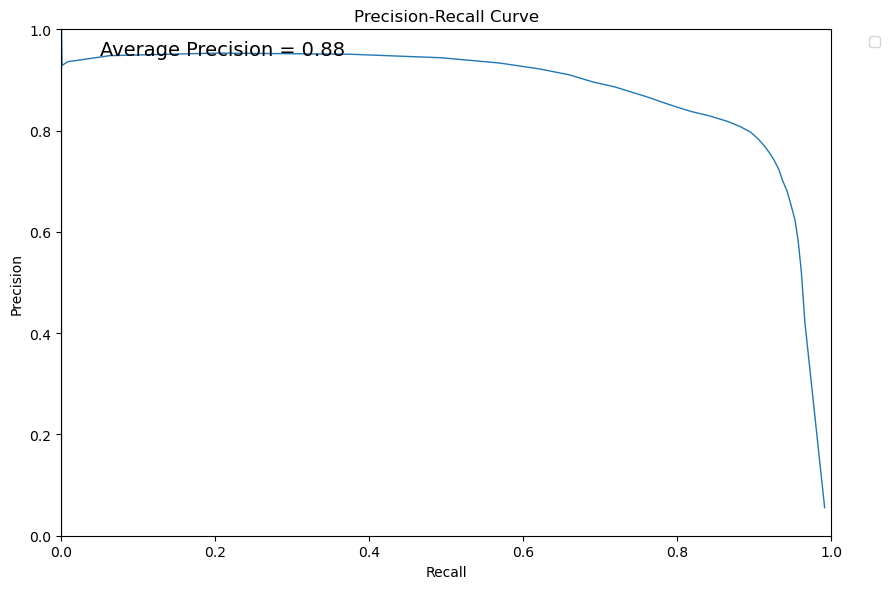

In [20]:
from scipy.integrate import simpson

py = precision
px = recall

save_path = '/vast/palmer/home.grace/eec42/BirdDetector/src/model/runs/detect/' + model_name + '/custom_PR_curve.jpg'

# Compute average Precision
area = metrics.auc(y=py, x=px)
print("area =", area)
print("Average Precision = area under PR curve, according to simpson interpolation = ", area)

fig, ax = plt.subplots(1, 1, figsize=(9, 6), tight_layout=True)
#py = np.stack(py, axis=1)

#for i, y in enumerate(py.T):
ax.plot(px, py, linewidth=1) #, label=f'{names[i]} {ap[i, 0]:.3f}')  # plot(recall, precision)

#ax.plot(px, py.mean(1), linewidth=3, color='blue', label='all classes %.3f mAP@0.5' % ap[:, 0].mean())
ax.set_xlabel('Recall')
ax.set_ylabel('Precision')
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.legend(loc='upper left', bbox_to_anchor=(1.04, 1))
ax.text(0.05, 0.95, f'Average Precision = {round(area, 2)}', transform=ax.transAxes, fontsize=14)
ax.set_title('Precision-Recall Curve')
fig.savefig(save_path, dpi=250)
plt.show()
plt.close(fig)


In [21]:
# Average Precision
from sklearn import metrics
#area = simpson(y=py, x=px)
area = metrics.auc(y=py, x=px)
print("area =", area)
print("Average Precision = area under PR curve, according to simpson interpolation = ", area)

area = 0.8804633617401123
Average Precision = area under PR curve, according to simpson interpolation =  0.8804633617401123


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


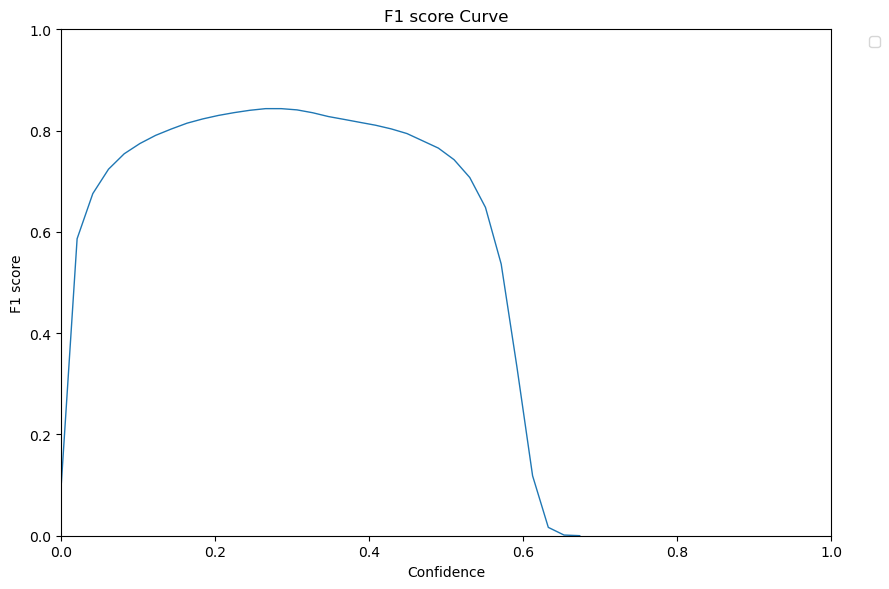

In [22]:
py = 2*(precision*recall)/(precision+recall)
px = CONF_THRESHOLDS

save_path = '/vast/palmer/home.grace/eec42/BirdDetector/src/model/runs/detect/' + model_name + '/custom_F1score_curve.jpg'


fig, ax = plt.subplots(1, 1, figsize=(9, 6), tight_layout=True)
#py = np.stack(py, axis=1)

#for i, y in enumerate(py.T):
ax.plot(px, py, linewidth=1) #, label=f'{names[i]} {ap[i, 0]:.3f}')  # plot(recall, precision)

#ax.plot(px, py.mean(1), linewidth=3, color='blue', label='all classes %.3f mAP@0.5' % ap[:, 0].mean())
ax.set_xlabel('Confidence')
ax.set_ylabel('F1 score')
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.legend(bbox_to_anchor=(1.04, 1), loc='upper left')
ax.set_title('F1 score Curve')
fig.savefig(save_path, dpi=250)
plt.show()
plt.close(fig)
